<a href="https://colab.research.google.com/github/ArwaASM/TPE/blob/main/Faster_RCNN_X_101_Training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Checking GPU Access**

In [ ]:
!nvidia-smi

Thu Oct 31 19:55:01 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off | 00000000:00:04.0 Off |                    0 |
| N/A   30C    P0              44W / 400W |      2MiB / 40960MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

## **Install Detectron2 Framework**

In [ ]:
!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
# !pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/TORCH_VERSION/index.html
# If there is not yet a detectron2 release that matches the given torch + CUDA version, you need to install a different pytorch.
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'
# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 5.9 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
torch:  2.5 ; cuda:  cu121
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-hvsadiws
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-hvsadiws
  Resolved https://github.com/facebookresearch/detectron2.git to commit 8d85329aed8506ea3672e3e208971345973ea761
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━

In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

## **Imort our Dataset**

In [ ]:
!curl -L "https://app.roboflow.com/ds/aTaO5L3keM?key=lJEBGAngCR" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

Streaming output truncated to the last 5000 lines.
 extracting: train/2024_05_08_07_50_IMG_1271_MOV-0009_jpg.rf.7066f65cec13351179ab996f8f34d43a.jpg  
 extracting: train/2024_05_08_07_50_IMG_1271_MOV-0009_jpg.rf.cb850909437f80771a491c036c003862.jpg  
 extracting: train/2024_05_08_07_50_IMG_1271_MOV-0011_jpg.rf.8e17bdacd6995cca2b169793013ae0d6.jpg  
 extracting: train/2024_05_08_07_50_IMG_1271_MOV-0011_jpg.rf.e435775fef22dbdb5d192adf42dd977a.jpg  
 extracting: train/2024_05_08_07_50_IMG_1271_MOV-0011_jpg.rf.fa798cdfebf3bf6b5ec9313d3584702d.jpg  
 extracting: train/2024_05_08_07_50_IMG_1271_MOV-0014_jpg.rf.613e68646b9816ef200362c73860f0a8.jpg  
 extracting: train/2024_05_08_07_50_IMG_1271_MOV-0014_jpg.rf.8f05cb248459e4c5b54cf2f5ffaf9188.jpg  
 extracting: train/2024_05_08_07_50_IMG_1271_MOV-0014_jpg.rf.add532de9d15c1b7039e411c2acc441c.jpg  
 extracting: train/2024_05_08_07_50_IMG_1271_MOV-0015_jpg.rf.35e0cdfa6c3fa3e83b6363fc6ba6a099.jpg  
 extracting: train/2024_05_08_07_50_IMG_1271_MOV-

## **Dataset Registration**

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")
register_coco_instances("my_dataset_valid", {}, "/content/valid/_annotations.coco.json", "/content/valid")

## **Visualize Samples of Training Dataset**

WARNING [10/31 00:09:58 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/31 00:09:58 d2.data.datasets.coco]: Loaded 6369 images in COCO format from /content/train/_annotations.coco.json


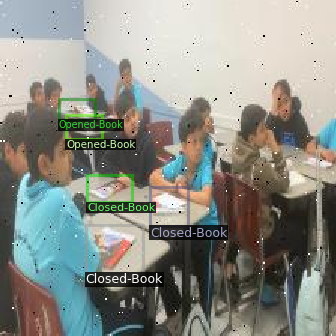

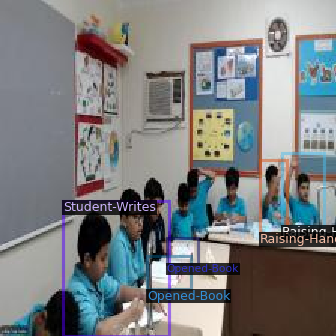

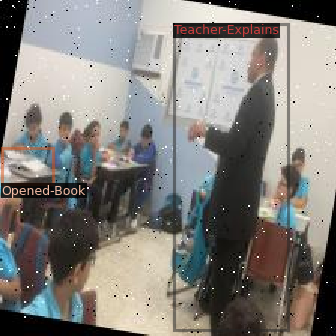

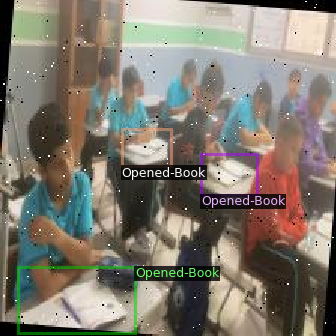

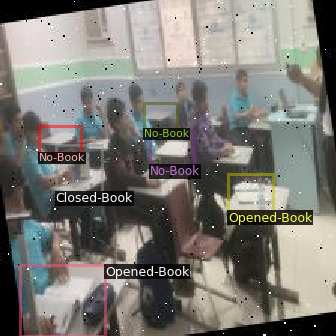

In [ ]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 5):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=1.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

WARNING [10/31 00:10:06 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/31 00:10:06 d2.data.datasets.coco]: Loaded 450 images in COCO format from /content/valid/_annotations.coco.json


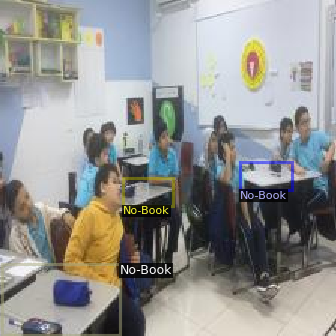

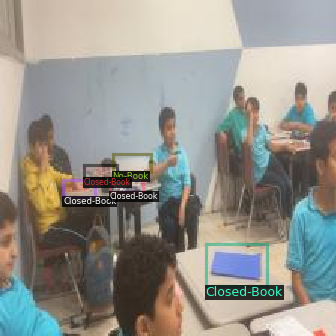

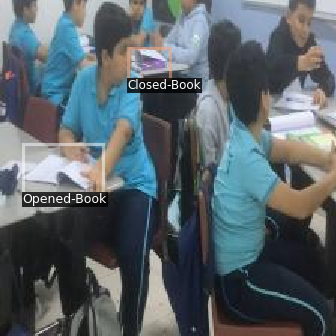

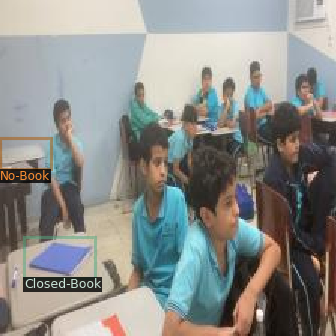

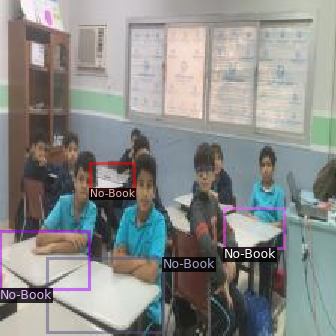

In [ ]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_valid")
dataset_dicts = DatasetCatalog.get("my_dataset_valid")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 5):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=1.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

WARNING [10/31 00:10:07 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/31 00:10:07 d2.data.datasets.coco]: Loaded 452 images in COCO format from /content/test/_annotations.coco.json


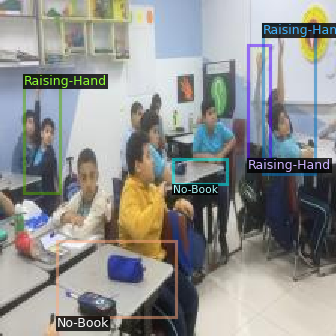

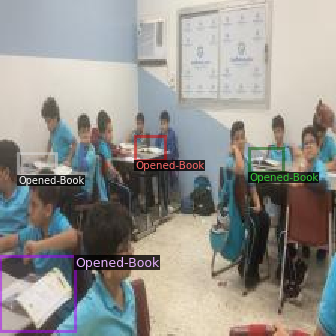

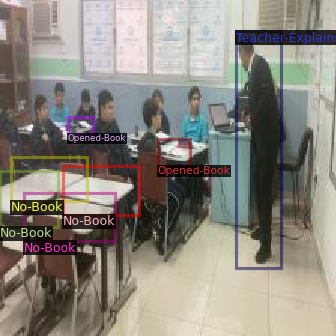

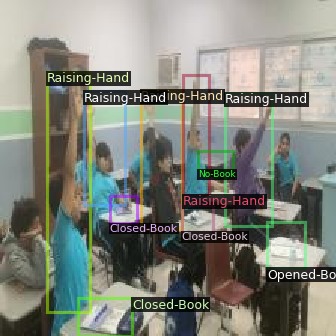

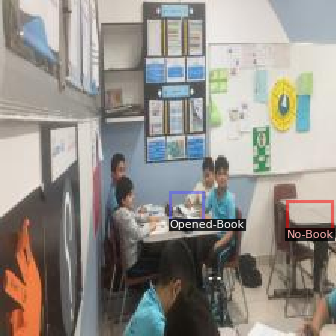

In [ ]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_test")
dataset_dicts = DatasetCatalog.get("my_dataset_test")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 5):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=1.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

## **Model Training: Faster_RCNN_X_101**

In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_valid",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 16
cfg.SOLVER.BASE_LR = 0.01  # pick a good LR
cfg.SOLVER.MAX_ITER = 39850   # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 11  # (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=True)
trainer.train()

[10/31 00:10:25 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_68b088.pkl: 421MB [00:02, 209MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[10/31 00:10:28 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[10/31 00:10:51 d2.utils.events]:  eta: 10:32:29  iter: 19  total_loss: 2.742  loss_cls: 2.418  loss_box_reg: 0.1964  loss_rpn_cls: 0.09884  loss_rpn_loc: 0.03529    time: 0.9483  last_time: 0.9491  data_time: 0.0852  last_data_time: 0.0757   lr: 0.00019981  max_mem: 23232M
[10/31 00:11:14 d2.utils.events]:  eta: 10:34:02  iter: 39  total_loss: 0.9295  loss_cls: 0.5508  loss_box_reg: 0.2761  loss_rpn_cls: 0.07343  loss_rpn_loc: 0.03239    time: 0.9558  last_time: 0.9635  data_time: 0.0819  last_data_time: 0.0839   lr: 0.00039961  max_mem: 23232M
[10/31 00:11:33 d2.utils.events]:  eta: 10:34:05  iter: 59  total_loss: 0.9129  loss_cls: 0.4719  loss_box_reg: 0.3216  loss_rpn_cls: 0.05673  loss_rpn_loc: 0.02958    time: 0.9567  last_time: 0.9527  data_time: 0.0777  last_data_time: 0.0747   lr: 0.00059941  max_mem: 23232M
[10/31 00:11:53 d2.utils.events]:  eta: 10:36:28  iter: 79  total_loss: 0.9303  loss_cls: 0.4677  loss_box_reg: 0.3908  loss_rpn_cls: 0.04245  loss_rpn_loc: 0.0286    time

## **Results Dashboard**

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

## **Model Inference**

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [10/31 11:36:48 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [10/31 11:36:48 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/31 11:36:48 d2.data.datasets.coco]: Loaded 452 images in COCO format from /content/test/_annotations.coco.json
[10/31 11:36:48 d2.data.build]: Distribution of instances among all 12 categories:
|   category    | #instances   |   category    | #instances   |   category    | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|:-------------:|:-------------|
|  Annotation   | 0            |  Closed-Book  | 404          | Electronic-.. | 0            |
|    No-Book    | 354          |  Opened-Book  | 585          | Raising-Hand  | 250          |
| Student-Ans.. | 54           | Student-Reads | 62           | Student-Wri.. | 33           |
| Teacher-Exp.. | 5

OrderedDict([('bbox',
              {'AP': 38.527530322741576,
               'AP50': 64.7254768762392,
               'AP75': 41.14853538366356,
               'APs': 29.150378033868773,
               'APm': 41.91330418485348,
               'APl': 52.6668473870698,
               'AP-Annotation': nan,
               'AP-Closed-Book': 48.75446129104783,
               'AP-Electronic-Book': nan,
               'AP-No-Book': 44.924231889592534,
               'AP-Opened-Book': 56.09472667158016,
               'AP-Raising-Hand': 36.050177955538416,
               'AP-Student-Answers': 49.60544534628017,
               'AP-Student-Reads': 28.199626002598155,
               'AP-Student-Writes': 22.5047037248235,
               'AP-Teacher-Explains': 57.36320247316766,
               'AP-Teacher-Follows-up-Students': 41.77872787278728,
               'AP-Worksheet': 0.0})])

In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_valid",)  # For evaluation
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_101_FPN_3x.yaml")  # Pretrained model
cfg.SOLVER.IMS_PER_BATCH = 16
cfg.SOLVER.BASE_LR = 0.01  # Learning rate
cfg.SOLVER.MAX_ITER = 39850  # Adjust for your dataset
cfg.MODEL.RETINANET.NUM_CLASSES = 11  # Number of classes in your dataset
cfg.OUTPUT_DIR = "./output2"

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

from detectron2.engine import DefaultTrainer

trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[10/31 11:44:07 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2)

model_final_971ab9.pkl: 228MB [00:01, 180MB/s]                           
head.cls_score.{bias, weight}
  pixel_mean
  pixel_std


[10/31 11:44:10 d2.engine.train_loop]: Starting training from iteration 0
[10/31 11:44:21 d2.utils.events]:  eta: 5:06:17  iter: 19  total_loss: 2.543  loss_cls: 1.677  loss_box_reg: 0.8651    time: 0.5502  last_time: 0.4636  data_time: 0.0857  last_data_time: 0.0812   lr: 0.00019981  max_mem: 23233M
[10/31 11:44:31 d2.utils.events]:  eta: 5:06:54  iter: 39  total_loss: 1.449  loss_cls: 0.9761  loss_box_reg: 0.4679    time: 0.5046  last_time: 0.4619  data_time: 0.0819  last_data_time: 0.0801   lr: 0.00039961  max_mem: 23233M
[10/31 11:44:40 d2.utils.events]:  eta: 5:08:08  iter: 59  total_loss: 1.162  loss_cls: 0.7043  loss_box_reg: 0.445    time: 0.4934  last_time: 0.4838  data_time: 0.0901  last_data_time: 0.0994   lr: 0.00059941  max_mem: 23233M
[10/31 11:44:50 d2.utils.events]:  eta: 5:08:23  iter: 79  total_loss: 0.9337  loss_cls: 0.5527  loss_box_reg: 0.3845    time: 0.4869  last_time: 0.4608  data_time: 0.0838  last_data_time: 0.0785   lr: 0.00079921  max_mem: 23233M
[10/31 11:4

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output2

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output2")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)